In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()


Bad key "text.kerning_factor" on line 4 in
C:\Users\Rambo\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
boston = pd.read_csv('C:/Users/Rambo/Downloads/Boston.csv')

In [4]:
boston

,Unnamed: 0,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,1,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,2,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,3,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,4,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,5,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,502,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,503,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,504,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,505,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


In [5]:
boston.shape

(506, 15)

In [6]:
boston.columns

Index(['Unnamed: 0', 'crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis',
       'rad', 'tax', 'ptratio', 'black', 'lstat', 'medv'],
      dtype='object')

In [7]:
boston = boston.drop(columns=['Unnamed: 0'])

In [8]:
boston.describe()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677082,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [9]:
boston.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   crim     506 non-null    float64
 1   zn       506 non-null    float64
 2   indus    506 non-null    float64
 3   chas     506 non-null    int64  
 4   nox      506 non-null    float64
 5   rm       506 non-null    float64
 6   age      506 non-null    float64
 7   dis      506 non-null    float64
 8   rad      506 non-null    int64  
 9   tax      506 non-null    int64  
 10  ptratio  506 non-null    float64
 11  black    506 non-null    float64
 12  lstat    506 non-null    float64
 13  medv     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


In [10]:
boston['chas'] = boston['chas'].astype(object)

In [11]:
boston['rad'].unique()

array([ 1,  2,  3,  5,  4,  8,  6,  7, 24], dtype=int64)

In [12]:
boston.isna().sum()  #no missing values.

crim       0
zn         0
indus      0
chas       0
nox        0
rm         0
age        0
dis        0
rad        0
tax        0
ptratio    0
black      0
lstat      0
medv       0
dtype: int64

In [13]:
boston['rad'] = boston['rad'].astype(object)

In [14]:
y = boston['medv']
X = boston.drop(columns=['medv'])

In [15]:
from pandas_profiling import ProfileReport

In [16]:
report = ProfileReport(boston,title="report",html = {'style':{'full_width':True}})

In [17]:
report

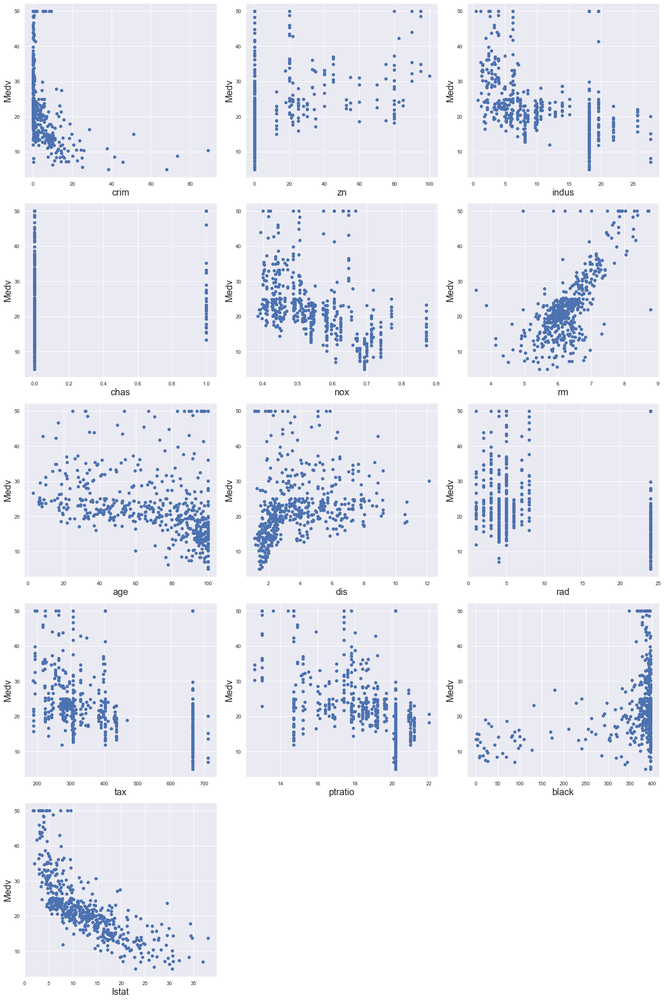

In [16]:
plt.figure(figsize=(20,30), facecolor='white')
plotnumber = 1

for column in X:
    if plotnumber<=15 :
        ax = plt.subplot(5,3,plotnumber)
        plt.scatter(X[column],y)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Medv',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [17]:
from sklearn.preprocessing import StandardScaler

In [18]:
scaler =StandardScaler()

X_scaled = scaler.fit_transform(X)

In [19]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = X_scaled

In [20]:
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]
vif["Features"] = X.columns

In [21]:
vif

,VIF,Features
0,1.792192,crim
1,2.298758,zn
2,3.991596,indus
3,1.073995,chas
4,4.393720,nox
5,1.933744,rm
6,3.100826,age
7,3.955945,dis
8,7.484496,rad
9,9.008554,tax


from VIF it is clear that variables 'tax' and 'rad' seems to cause multicollinearity issues.

In [22]:
X_scaled.shape

(506, 13)

In [23]:
boston.columns

Index(['crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis', 'rad', 'tax',
       'ptratio', 'black', 'lstat', 'medv'],
      dtype='object')

In [24]:
X_scaled_df = pd.DataFrame(X_scaled,columns=['crim','zn','indus','chas','nox','rm','age','dis','rad','tax','ptratio','black','lstat'])

In [25]:
X_scaled_df.shape

(506, 13)

In [26]:
X_scaled_df.columns

Index(['crim', 'zn', 'indus', 'chas', 'nox', 'rm', 'age', 'dis', 'rad', 'tax',
       'ptratio', 'black', 'lstat'],
      dtype='object')

In [27]:
X_scaled_df = X_scaled_df.drop(columns=['rad','tax'])

In [28]:
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LinearRegression
from sklearn.model_selection import train_test_split
import statsmodels.api as sm 

In [30]:
x_train,x_test,y_train,y_test = train_test_split(X_scaled_df,y,test_size = 0.20,random_state=355)

In [31]:
regression = LinearRegression()

regression.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [32]:
regression.score(x_train,y_train)

0.7087145734849325

In [33]:
def adj_r2(x,y):
    r2 = regression.score(x,y)
    n = x.shape[0]
    p = x.shape[1]
    adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
    return adjusted_r2

In [34]:
adj_r2(x_train,y_train)

0.7005407477408873

In [35]:
regression.score(x_test,y_test)

0.8329150776265076

In [36]:
adj_r2(x_test,y_test)

0.8124935871141918

In [37]:
lasscv = LassoCV(alphas = None,cv =10, max_iter = 100000, normalize = True)
lasscv.fit(x_train, y_train)

LassoCV(alphas=None, copy_X=True, cv=10, eps=0.001, fit_intercept=True,
        max_iter=100000, n_alphas=100, n_jobs=None, normalize=True,
        positive=False, precompute='auto', random_state=None,
        selection='cyclic', tol=0.0001, verbose=False)

In [38]:
# best alpha parameter
alpha = lasscv.alpha_
alpha

0.004546256510031798

In [39]:
lasso_reg = Lasso(alpha)
lasso_reg.fit(x_train, y_train)

Lasso(alpha=0.004546256510031798, copy_X=True, fit_intercept=True,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [40]:
lasso_reg.score(x_test, y_test)

0.8334926446732662

In [41]:
alphas = np.random.uniform(low=0, high=10, size=(50,))
ridgecv = RidgeCV(alphas = alphas,cv=10,normalize = True)
ridgecv.fit(x_train, y_train)

RidgeCV(alphas=array([5.56672381, 8.73856364, 7.79326367, 2.8165868 , 1.24853035,
       2.59538522, 8.88916281, 8.53911491, 0.98382361, 9.79713962,
       3.06119629, 5.32440036, 3.24067248, 8.49115995, 0.73296971,
       3.15248736, 3.09908528, 0.20723443, 2.74790223, 9.85783909,
       3.62378268, 1.88866153, 1.34980477, 1.35228902, 3.84880232,
       4.8059307 , 8.23570285, 5.79332341, 0.40971857, 5.06233162,
       5.97335568, 9.3229466 , 2.80629332, 0.22078403, 7.55647012,
       3.57842149, 7.17840594, 0.42418073, 7.16168607, 5.24037838,
       0.87420575, 8.47991537, 4.55273827, 8.26014854, 3.30751162,
       5.8783469 , 4.92342109, 2.29434911, 8.8203578 , 6.50376854]),
        cv=10, fit_intercept=True, gcv_mode=None, normalize=True, scoring=None,
        store_cv_values=False)

In [42]:
ridgecv.alpha_

0.2072344280422922

In [43]:
ridge_model = Ridge(alpha=ridgecv.alpha_)
ridge_model.fit(x_train, y_train)

Ridge(alpha=0.2072344280422922, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [44]:
ridge_model.score(x_test, y_test)

0.8331281909888453